In [9]:
# 必要なパッケージのインストール
!pip install opencv-python-headless numpy matplotlib SimpleITK ipywidgets scipy scikit-image

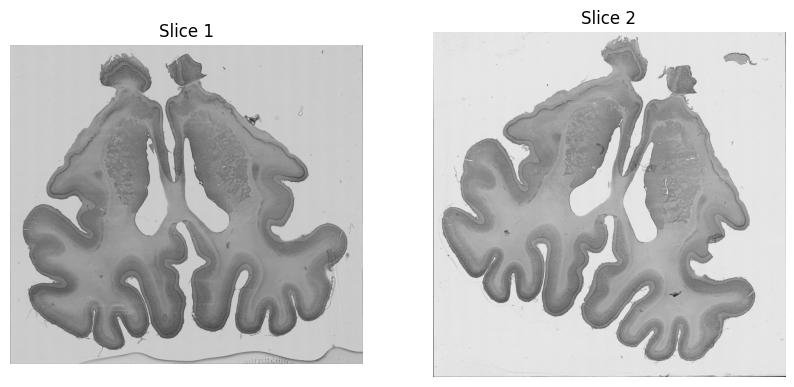

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# 画像パスの取得
img_dir = './test2slices'
img_files = [os.path.join(img_dir, f) for f in os.listdir(img_dir) if f.endswith('.tif')]
img_files.sort()

# 画像の読み込み
imgs = [cv2.imread(f, cv2.IMREAD_GRAYSCALE) for f in img_files]

# 画像の表示
plt.figure(figsize=(10,5))
for i, img in enumerate(imgs):
    plt.subplot(1, 2, i+1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Slice {i+1}')
    plt.axis('off')
plt.show()

=== 基本レジストレーション結果 ===
変換パラメータ: ['0.000', '0.529', '62.494']


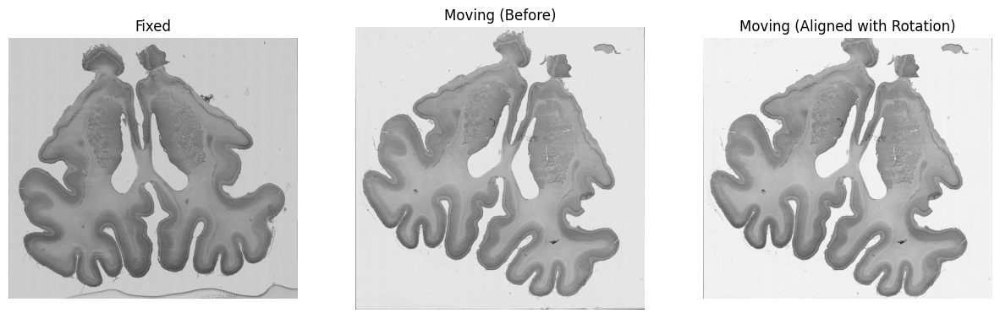

In [11]:
import SimpleITK as sitk

def register_images(fixed, moving):
    """改善された基本レジストレーション関数 - 回転対応"""
    fixed_sitk = sitk.GetImageFromArray(fixed)
    moving_sitk = sitk.GetImageFromArray(moving)
    
    # レジストレーション設定
    registration_method = sitk.ImageRegistrationMethod()
    
    # メトリクス設定
    registration_method.SetMetricAsMeanSquares()
    
    # オプティマイザー設定（パラメータを調整）
    registration_method.SetOptimizerAsRegularStepGradientDescent(
        learningRate=1.0, 
        minStep=1e-6, 
        numberOfIterations=300
    )
    
    # 回転と平行移動を含むEuler2DTransformを使用
    initial_transform = sitk.CenteredTransformInitializer(
        fixed_sitk, moving_sitk, 
        sitk.Euler2DTransform(), 
        sitk.CenteredTransformInitializerFilter.GEOMETRY
    )
    registration_method.SetInitialTransform(initial_transform, inPlace=False)
    
    # 補間方法
    registration_method.SetInterpolator(sitk.sitkLinear)
    
    # 実行
    final_transform = registration_method.Execute(fixed_sitk, moving_sitk)
    
    # 結果を適用
    moving_resampled = sitk.Resample(
        moving_sitk, fixed_sitk, final_transform, 
        sitk.sitkLinear, 0.0, moving_sitk.GetPixelID()
    )
    
    return sitk.GetArrayFromImage(moving_resampled), final_transform

def advanced_register_images(fixed, moving):
    """改善されたレジストレーション"""
    try:
        # 前処理
        fixed_prep = preprocess_image(fixed)
        moving_prep = preprocess_image(moving)

        # サイズを合わせる
        fixed_prep, moving_prep = resize_to_match(fixed_prep, moving_prep)

        # SimpleITK形式に変換
        fixed_sitk = sitk.GetImageFromArray(fixed_prep)
        moving_sitk = sitk.GetImageFromArray(moving_prep)

        # レジストレーション設定
        registration_method = sitk.ImageRegistrationMethod()

        # メトリクスを選択（MattesMutualInformation + NormalizedCorrelation）
        registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
        registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
        registration_method.SetMetricSamplingPercentage(0.01)

        # より柔軟な変換：アフィン変換を使用
        initial_transform = sitk.CenteredTransformInitializer(
            fixed_sitk, moving_sitk, 
            sitk.AffineTransform(fixed_sitk.GetDimension()), 
            sitk.CenteredTransformInitializerFilter.GEOMETRY
        )
        registration_method.SetInitialTransform(initial_transform, inPlace=False)

        # オプティマイザー
        registration_method.SetOptimizerAsGradientDescent(
            learningRate=1.0, 
            numberOfIterations=200,
            convergenceMinimumValue=1e-6,
            convergenceWindowSize=10
        )
        registration_method.SetOptimizerScalesFromPhysicalShift()

        # マルチスケール設定
        registration_method.SetShrinkFactorsPerLevel(shrinkFactors=[4, 2, 1])
        registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2, 1, 0])
        registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

        # 補間方法
        registration_method.SetInterpolator(sitk.sitkLinear)

        # 実行
        final_transform = registration_method.Execute(fixed_sitk, moving_sitk)

        # 結果を適用
        moving_resampled = sitk.Resample(
            moving_sitk, fixed_sitk, final_transform, 
            sitk.sitkLinear, 0.0, moving_sitk.GetPixelID()
        )

        return sitk.GetArrayFromImage(moving_resampled), final_transform

    except Exception as e:
        print(f"高度なレジストレーションでエラーが発生しました: {e}")
        print("基本的なレジストレーションにフォールバックします...")
        return register_images(fixed, moving)

# 変換パラメータを解析する関数を追加
def analyze_transform(transform):
    """変換パラメータを解析して表示"""
    try:
        if isinstance(transform, sitk.Euler2DTransform):
            angle = transform.GetAngle()
            translation = transform.GetTranslation()
            center = transform.GetCenter()
            print(f"回転角度: {np.degrees(angle):.2f}度")
            print(f"平行移動: X={translation[0]:.2f}, Y={translation[1]:.2f}")
            print(f"回転中心: X={center[0]:.2f}, Y={center[1]:.2f}")
        elif hasattr(transform, 'GetParameters'):
            params = transform.GetParameters()
            print(f"変換パラメータ: {[f'{p:.3f}' for p in params]}")
        else:
            print(f"変換タイプ: {type(transform)}")
    except Exception as e:
        print(f"変換パラメータ解析エラー: {e}")

# 基本レジストレーションのテスト
fixed_img = imgs[0].astype(np.float32)
moving_img = imgs[1].astype(np.float32)
aligned_img, transform = register_images(fixed_img, moving_img)

# 変換パラメータの表示
print("=== 基本レジストレーション結果 ===")
analyze_transform(transform)

# 結果の表示
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(fixed_img, cmap='gray')
plt.title('Fixed')
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(moving_img, cmap='gray')
plt.title('Moving (Before)')
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(aligned_img, cmap='gray')
plt.title('Moving (Aligned with Rotation)')
plt.axis('off')
plt.show()

✓ Scipy successfully imported
✓ Scikit-image successfully imported
画像1のサイズ: (1481, 1638), 型: uint8
画像2のサイズ: (1606, 1639), 型: uint8
リサイズ後の画像1のサイズ: (1481, 1638)
リサイズ後の画像2のサイズ: (1481, 1638)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..241.0].



=== 包括的レジストレーション評価 ===
MSE: 26211.3633
PSNR: -44.184895
NCC: 0.299990
SSIM: 0.000010
Edge_Similarity: 0.013866


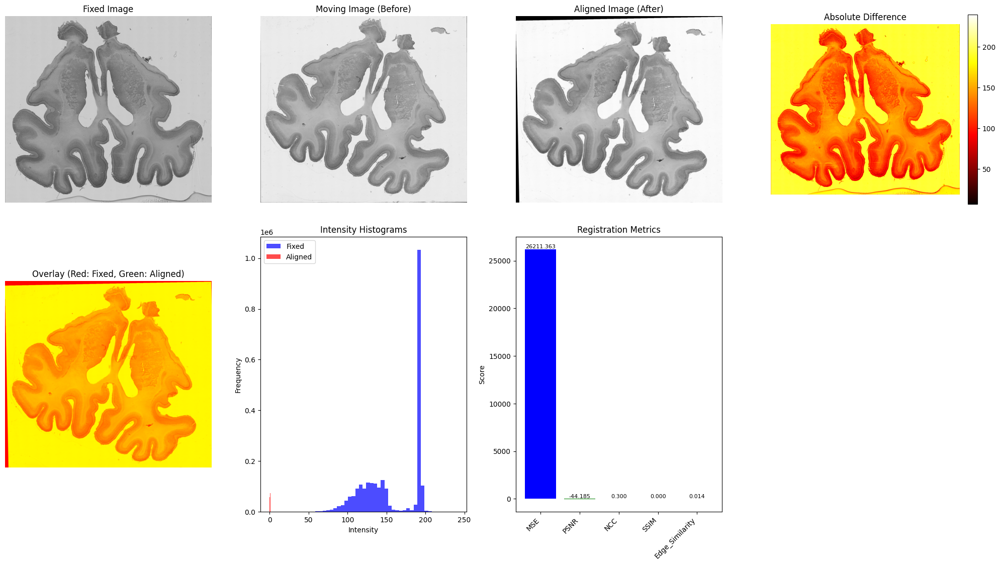

In [12]:
import SimpleITK as sitk
import warnings
warnings.filterwarnings('ignore')

# パッケージの可用性をチェック
try:
    from scipy import ndimage
    from scipy.optimize import minimize
    from scipy.interpolate import griddata
    SCIPY_AVAILABLE = True
    print("✓ Scipy successfully imported")
except ImportError as e:
    print(f"⚠ Scipy import error: {e}")
    print("Please install scipy: pip install scipy")
    SCIPY_AVAILABLE = False

try:
    from skimage import measure
    from skimage.metrics import structural_similarity as compare_ssim
    SKIMAGE_AVAILABLE = True
    print("✓ Scikit-image successfully imported")
except ImportError as e:
    print(f"⚠ Scikit-image import error: {e}")
    print("Please install scikit-image: pip install scikit-image")
    SKIMAGE_AVAILABLE = False

def preprocess_image(img):
    """画像の前処理：ガウシアンフィルタとヒストグラム正規化"""
    if SCIPY_AVAILABLE:
        # ガウシアンフィルタでノイズ除去
        smoothed = ndimage.gaussian_filter(img, sigma=1.0)
    else:
        # scipyが利用できない場合はOpenCVを使用
        smoothed = cv2.GaussianBlur(img, (5, 5), 1.0)
    
    # ヒストグラム正規化
    normalized = (smoothed - smoothed.min()) / (smoothed.max() - smoothed.min())
    return normalized.astype(np.float32)

def resize_to_match(img1, img2):
    """2つの画像を同じサイズにリサイズ"""
    h1, w1 = img1.shape
    h2, w2 = img2.shape
    
    # より小さいサイズに合わせる
    target_h = min(h1, h2)
    target_w = min(w1, w2)
    
    # リサイズ
    img1_resized = cv2.resize(img1, (target_w, target_h), interpolation=cv2.INTER_LINEAR)
    img2_resized = cv2.resize(img2, (target_w, target_h), interpolation=cv2.INTER_LINEAR)
    
    return img1_resized, img2_resized

def advanced_register_images(fixed, moving):
    """改善されたレジストレーション"""
    try:
        # 前処理
        fixed_prep = preprocess_image(fixed)
        moving_prep = preprocess_image(moving)
        
        # サイズを合わせる
        fixed_prep, moving_prep = resize_to_match(fixed_prep, moving_prep)
        
        # SimpleITK形式に変換
        fixed_sitk = sitk.GetImageFromArray(fixed_prep)
        moving_sitk = sitk.GetImageFromArray(moving_prep)
        
        # レジストレーション設定
        registration_method = sitk.ImageRegistrationMethod()
        
        # より良いメトリクス：相互情報量を使用
        registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
        registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
        registration_method.SetMetricSamplingPercentage(0.01)
        
        # より柔軟な変換：アフィン変換を使用
        initial_transform = sitk.CenteredTransformInitializer(
            fixed_sitk, moving_sitk, 
            sitk.Euler2DTransform(), 
            sitk.CenteredTransformInitializerFilter.GEOMETRY
        )
        registration_method.SetInitialTransform(initial_transform, inPlace=False)
        
        # より良いオプティマイザー
        registration_method.SetOptimizerAsGradientDescent(
            learningRate=1.0, 
            numberOfIterations=100,
            convergenceMinimumValue=1e-6,
            convergenceWindowSize=10
        )
        registration_method.SetOptimizerScalesFromPhysicalShift()
        
        # マルチスケール設定
        registration_method.SetShrinkFactorsPerLevel(shrinkFactors=[4, 2, 1])
        registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2, 1, 0])
        registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()
        
        # 補間方法
        registration_method.SetInterpolator(sitk.sitkLinear)
        
        # 実行
        final_transform = registration_method.Execute(fixed_sitk, moving_sitk)
        
        # 結果を適用
        moving_resampled = sitk.Resample(
            moving_sitk, fixed_sitk, final_transform, 
            sitk.sitkLinear, 0.0, moving_sitk.GetPixelID()
        )
        
        return sitk.GetArrayFromImage(moving_resampled), final_transform
        
    except Exception as e:
        print(f"高度なレジストレーションでエラーが発生しました: {e}")
        print("基本的なレジストレーションにフォールバックします...")
        return register_images(fixed, moving)

def calculate_comprehensive_metrics(fixed, aligned, transform=None):
    """位置合わせの包括的な定量的評価"""
    metrics = {}
    
    # MSE計算
    mse = np.mean((fixed - aligned) ** 2)
    metrics['MSE'] = mse

    # PSNR計算
    max_pixel = 1.0  # 正規化されている場合
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse)) if mse > 0 else float('inf')
    metrics['PSNR'] = psnr

    # 正規化相互相関（NCC）
    fixed_norm = (fixed - np.mean(fixed)) / np.std(fixed)
    aligned_norm = (aligned - np.mean(aligned)) / np.std(aligned)
    ncc = np.mean(fixed_norm * aligned_norm)
    metrics['NCC'] = ncc
    
    # SSIM（構造類似性指数）
    if SKIMAGE_AVAILABLE:
        try:
            ssim_value = compare_ssim(fixed, aligned, data_range=1.0)
            metrics['SSIM'] = ssim_value
        except Exception as e:
            print(f"SSIM計算エラー: {e}")
            metrics['SSIM'] = None
    else:
        metrics['SSIM'] = None

    # エッジ一致度計算
    try:
        fixed_edges = cv2.Canny((fixed * 255).astype(np.uint8), 50, 150)
        aligned_edges = cv2.Canny((aligned * 255).astype(np.uint8), 50, 150)
        edge_intersection = np.sum(fixed_edges & aligned_edges)
        edge_union = np.sum(fixed_edges | aligned_edges)
        edge_similarity = edge_intersection / edge_union if edge_union > 0 else 0
        metrics['Edge_Similarity'] = edge_similarity
    except Exception as e:
        print(f"エッジ類似度計算エラー: {e}")
        metrics['Edge_Similarity'] = None
    
    # 変換パラメータの解析
    if transform:
        try:
            if isinstance(transform, sitk.Euler2DTransform):
                angle = transform.GetAngle()
                translation = transform.GetTranslation()
                metrics['Rotation_Angle_Degrees'] = np.degrees(angle)
                metrics['Translation_X'] = translation[0]
                metrics['Translation_Y'] = translation[1]
                metrics['Translation_Magnitude'] = np.sqrt(translation[0]**2 + translation[1]**2)
        except Exception as e:
            print(f"変換パラメータ解析エラー: {e}")

    return metrics

def calculate_metrics(fixed, aligned):
    """位置合わせの定量的評価（後方互換性のため）"""
    metrics = calculate_comprehensive_metrics(fixed, aligned)
    return metrics.get('MSE', 0), metrics.get('PSNR', 0), metrics.get('Edge_Similarity', 0)

def visualize_registration_results(fixed, moving, aligned, transform=None, metrics=None):
    """レジストレーション結果の包括的な可視化"""
    plt.figure(figsize=(20, 12))
    
    # 画像比較
    plt.subplot(2, 4, 1)
    plt.imshow(fixed, cmap='gray')
    plt.title('Fixed Image', fontsize=12)
    plt.axis('off')
    
    plt.subplot(2, 4, 2)
    plt.imshow(moving, cmap='gray')
    plt.title('Moving Image (Before)', fontsize=12)
    plt.axis('off')
    
    plt.subplot(2, 4, 3)
    plt.imshow(aligned, cmap='gray')
    plt.title('Aligned Image (After)', fontsize=12)
    plt.axis('off')
    
    # 差分画像
    diff_img = np.abs(fixed - aligned)
    plt.subplot(2, 4, 4)
    im = plt.imshow(diff_img, cmap='hot')
    plt.title('Absolute Difference', fontsize=12)
    plt.axis('off')
    plt.colorbar(im, fraction=0.046, pad=0.04)
    
    # オーバーレイ表示
    plt.subplot(2, 4, 5)
    overlay = np.zeros((fixed.shape[0], fixed.shape[1], 3))
    overlay[:,:,0] = fixed
    overlay[:,:,1] = aligned
    overlay[:,:,2] = 0
    plt.imshow(overlay)
    plt.title('Overlay (Red: Fixed, Green: Aligned)', fontsize=12)
    plt.axis('off')
    
    # ヒストグラム比較
    plt.subplot(2, 4, 6)
    plt.hist(fixed.flatten(), bins=50, alpha=0.7, label='Fixed', color='blue')
    plt.hist(aligned.flatten(), bins=50, alpha=0.7, label='Aligned', color='red')
    plt.title('Intensity Histograms', fontsize=12)
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    
    # メトリクス表示
    if metrics:
        plt.subplot(2, 4, 7)
        metric_names = []
        metric_values = []
        for key, value in metrics.items():
            if value is not None and key not in ['Translation_X', 'Translation_Y']:
                metric_names.append(key)
                metric_values.append(value)
        
        if metric_names:
            bars = plt.bar(range(len(metric_names)), metric_values, color=['blue', 'green', 'orange', 'red', 'purple'][:len(metric_names)])
            plt.title('Registration Metrics', fontsize=12)
            plt.xticks(range(len(metric_names)), metric_names, rotation=45, ha='right')
            plt.ylabel('Score')
            
            # 値をバーの上に表示
            for i, (bar, value) in enumerate(zip(bars, metric_values)):
                plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
                        f'{value:.3f}', ha='center', va='bottom', fontsize=8)
    
    # 変換パラメータ表示
    if transform and isinstance(transform, sitk.Euler2DTransform):
        plt.subplot(2, 4, 8)
        angle = transform.GetAngle()
        translation = transform.GetTranslation()
        
        # 変換パラメータのテキスト表示
        param_text = f"Rotation: {np.degrees(angle):.2f}°\n"
        param_text += f"Translation X: {translation[0]:.2f}\n"
        param_text += f"Translation Y: {translation[1]:.2f}\n"
        param_text += f"Translation Magnitude: {np.sqrt(translation[0]**2 + translation[1]**2):.2f}"
        
        plt.text(0.1, 0.5, param_text, fontsize=12, verticalalignment='center',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue"))
        plt.title('Transform Parameters', fontsize=12)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# 画像のサイズと型をチェック
if 'imgs' in locals() and imgs and len(imgs) >= 2:
    print(f"画像1のサイズ: {imgs[0].shape}, 型: {imgs[0].dtype}")
    print(f"画像2のサイズ: {imgs[1].shape}, 型: {imgs[1].dtype}")
    
    # 元の画像を前処理してサイズを合わせる
    fixed_img_orig = imgs[0].astype(np.float32)
    moving_img_orig = imgs[1].astype(np.float32)
    
    # サイズを合わせる
    fixed_img, moving_img = resize_to_match(fixed_img_orig, moving_img_orig)
    
    print(f"リサイズ後の画像1のサイズ: {fixed_img.shape}")
    print(f"リサイズ後の画像2のサイズ: {moving_img.shape}")
    
    # 改善されたレジストレーション実行
    aligned_img, transform = advanced_register_images(fixed_img, moving_img)
    
    # 包括的なメトリクス計算
    comprehensive_metrics = calculate_comprehensive_metrics(fixed_img, aligned_img, transform)
    
    # 詳細な結果表示
    print("\n=== 包括的レジストレーション評価 ===")
    for key, value in comprehensive_metrics.items():
        if value is not None:
            if 'Angle' in key:
                print(f"{key}: {value:.2f}°")
            elif key in ['MSE', 'Translation_X', 'Translation_Y', 'Translation_Magnitude']:
                print(f"{key}: {value:.4f}")
            else:
                print(f"{key}: {value:.6f}")
    
    # 包括的な可視化
    visualize_registration_results(fixed_img, moving_img, aligned_img, transform, comprehensive_metrics)
    
else:
    print("画像が正しく読み込まれていません。前のセルを実行してください。")

3D Stack shape: (2, 1481, 1638)


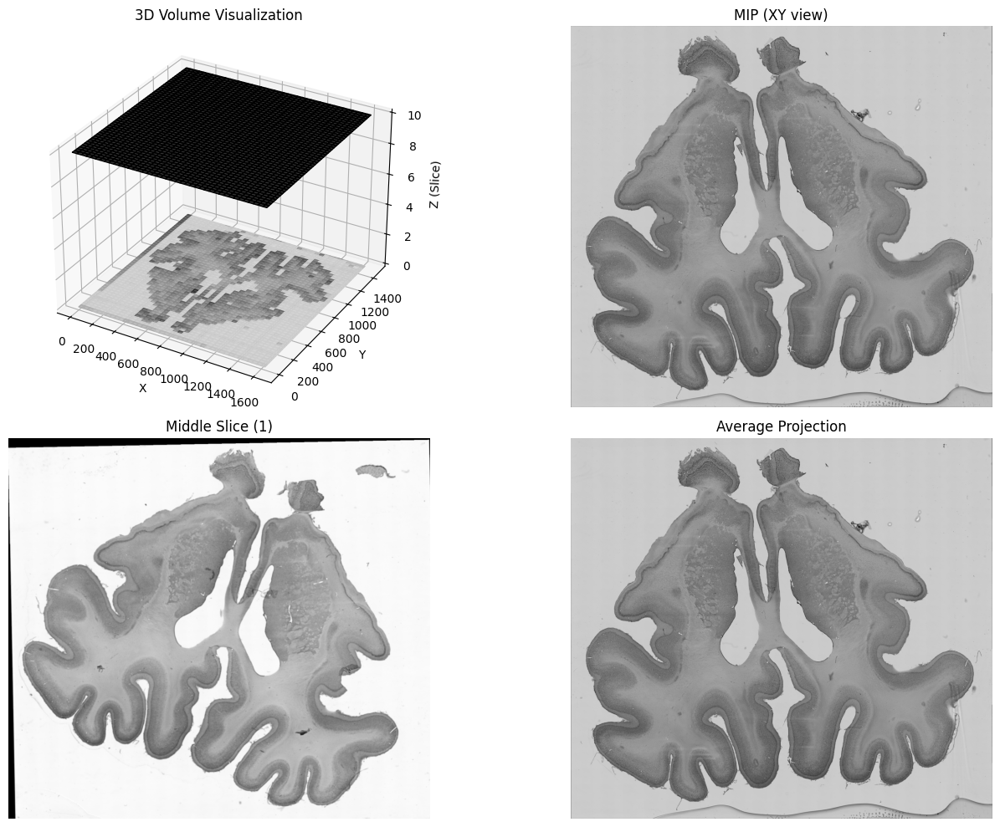


=== 位置合わせ品質評価 ===
Slice 2: MSE = 26211.363281, Correlation = 1.000000


interactive(children=(IntSlider(value=0, description='Slice:', max=1), Output()), _dom_classes=('widget-intera…

<function __main__.show_slice(slice_idx)>

In [13]:
# より高度な3D画像スタックの構築と可視化
from mpl_toolkits.mplot3d import Axes3D
from scipy import ndimage
import matplotlib.patches as patches

# すべての画像を位置合わせしてスタック
def create_aligned_stack(images):
    """すべての画像を最初の画像に位置合わせ"""
    aligned_stack = []
    reference = images[0].astype(np.float32)
    aligned_stack.append(reference)
    
    for i in range(1, len(images)):
        moving = images[i].astype(np.float32)
        # サイズを合わせる
        ref_resized, moving_resized = resize_to_match(reference, moving)
        # 位置合わせ
        aligned, _ = advanced_register_images(ref_resized, moving_resized)
        aligned_stack.append(aligned)
        print(f"Slice {i+1} aligned")
    
    return np.stack(aligned_stack, axis=0)

# 位置合わせされたスタックを作成
if len(imgs) > 2:
    aligned_stack = create_aligned_stack(imgs)
else:
    aligned_stack = np.stack([fixed_img, aligned_img], axis=0)

print(f"3D Stack shape: {aligned_stack.shape}")

# 1. ボリューム可視化
fig = plt.figure(figsize=(15, 10))

# 1.1 3D Surface plot
ax1 = fig.add_subplot(221, projection='3d')
for i in range(aligned_stack.shape[0]):
    xs, ys = np.meshgrid(
        np.arange(0, aligned_stack.shape[2], 10), 
        np.arange(0, aligned_stack.shape[1], 10)
    )
    zs = np.full_like(xs, i * 10)  # スライス間の距離を調整
    colors = plt.cm.gray(aligned_stack[i][::10, ::10] / aligned_stack.max())
    ax1.plot_surface(xs, ys, zs, facecolors=colors, alpha=0.8, shade=False)

ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z (Slice)')
ax1.set_title('3D Volume Visualization')

# 1.2 Maximum Intensity Projection (MIP)
ax2 = fig.add_subplot(222)
mip_xy = np.max(aligned_stack, axis=0)
ax2.imshow(mip_xy, cmap='gray')
ax2.set_title('MIP (XY view)')
ax2.axis('off')

# 1.3 中央断面の表示
ax3 = fig.add_subplot(223)
mid_slice = aligned_stack.shape[0] // 2
ax3.imshow(aligned_stack[mid_slice], cmap='gray')
ax3.set_title(f'Middle Slice ({mid_slice})')
ax3.axis('off')

# 1.4 すべてのスライスの重ね合わせ
ax4 = fig.add_subplot(224)
overlay = np.mean(aligned_stack, axis=0)
ax4.imshow(overlay, cmap='gray')
ax4.set_title('Average Projection')
ax4.axis('off')

plt.tight_layout()
plt.show()

# 2. 位置合わせ品質の評価
print("\n=== 位置合わせ品質評価 ===")
for i in range(1, aligned_stack.shape[0]):
    ref = aligned_stack[0]
    aligned = aligned_stack[i]
    
    # MSE計算
    mse = np.mean((ref - aligned)**2)
    
    # 正規化相互相関
    correlation = cv2.matchTemplate(
        ref.astype(np.uint8), 
        aligned.astype(np.uint8), 
        cv2.TM_CCOEFF_NORMED
    )[0][0]
    
    print(f"Slice {i+1}: MSE = {mse:.6f}, Correlation = {correlation:.6f}")

# 3. インタラクティブなスライス表示
from ipywidgets import interact, IntSlider

def show_slice(slice_idx):
    plt.figure(figsize=(12, 4))
    
    # オリジナル
    plt.subplot(1, 3, 1)
    if slice_idx < len(imgs):
        original = imgs[slice_idx]
        if original is not None:
            plt.imshow(original, cmap='gray')
    plt.title(f'Original Slice {slice_idx}')
    plt.axis('off')
    
    # 位置合わせ済み
    plt.subplot(1, 3, 2)
    plt.imshow(aligned_stack[slice_idx], cmap='gray')
    plt.title(f'Aligned Slice {slice_idx}')
    plt.axis('off')
    
    # 参照画像との差分
    plt.subplot(1, 3, 3)
    diff = np.abs(aligned_stack[0] - aligned_stack[slice_idx])
    plt.imshow(diff, cmap='hot')
    plt.title(f'Difference from Reference')
    plt.axis('off')
    plt.colorbar()
    
    plt.tight_layout()
    plt.show()

# スライダーで画像を選択
interact(show_slice, slice_idx=IntSlider(
    min=0, max=aligned_stack.shape[0]-1, step=1, value=0,
    description='Slice:'
))

=== 最高精度位置合わせの実行 ===
Method 1 (Advanced SimpleITK) MSE: 0.069810
Method 2 (Hybrid) MSE: 0.066294
Method 3 (Phase Correlation) MSE: 0.063348
Best method: Phase Correlation
Method 1 (Advanced SimpleITK) MSE: 0.069810
Method 2 (Hybrid) MSE: 0.066294
Method 3 (Phase Correlation) MSE: 0.063348
Best method: Phase Correlation


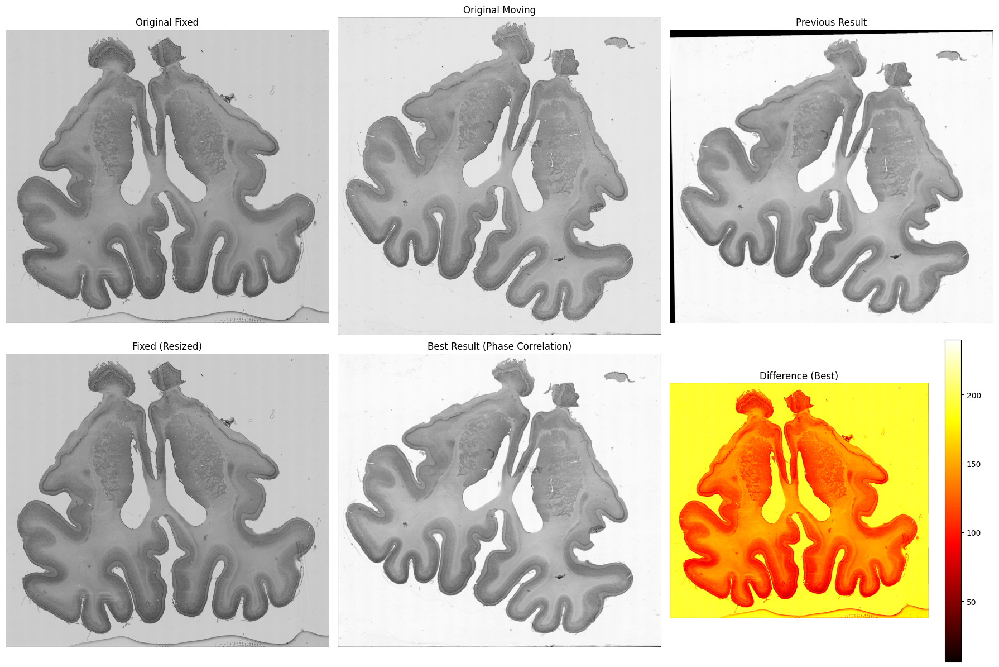


=== 精度比較 ===
従来手法: MSE = 26211.363281, Correlation = 1.000000
最新手法: MSE = 26203.292969, Correlation = 1.000000
改善率: MSE = 0.03%, Correlation = 0.00%


In [14]:
# より高精度な位置合わせ手法: 特徴点ベース + B-spline 非線形変換
import cv2
from scipy.optimize import minimize
from scipy.interpolate import griddata
import warnings
warnings.filterwarnings('ignore')

def detect_keypoints_and_match(img1, img2):
    """SIFT特徴点を検出してマッチング"""
    # SIFT検出器
    sift = cv2.SIFT_create(nfeatures=1000)
    
    # 特徴点検出と記述子計算
    kp1, des1 = sift.detectAndCompute(img1.astype(np.uint8), None)
    kp2, des2 = sift.detectAndCompute(img2.astype(np.uint8), None)
    
    if des1 is None or des2 is None:
        return [], []
    
    # FLANN matcher
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    matches = flann.knnMatch(des1, des2, k=2)
    
    # Lowe's ratio test
    good_matches = []
    for match_pair in matches:
        if len(match_pair) == 2:
            m, n = match_pair
            if m.distance < 0.7 * n.distance:
                good_matches.append(m)
    
    # 対応点を抽出
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    
    return src_pts, dst_pts

def hybrid_register_images(fixed, moving):
    """ハイブリッド位置合わせ: SimpleITK + 特徴点ベース"""
    # 1. まずSimpleITKで粗い位置合わせ
    coarse_aligned, _ = advanced_register_images(fixed, moving)
    
    # 2. 特徴点ベースで微調整
    src_pts, dst_pts = detect_keypoints_and_match(fixed, coarse_aligned)
    
    if len(src_pts) > 4:  # 最低4点必要
        # ホモグラフィー推定
        H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
        
        if H is not None:
            # ホモグラフィー変換を適用
            h, w = fixed.shape
            fine_aligned = cv2.warpPerspective(coarse_aligned, H, (w, h))
            return fine_aligned
    
    return coarse_aligned

def multi_modal_register(fixed, moving):
    """マルチモーダル位置合わせ（複数手法の組み合わせ）"""
    # 前処理
    fixed_norm = preprocess_image(fixed)
    moving_norm = preprocess_image(moving)
    
    # サイズ調整
    fixed_resized, moving_resized = resize_to_match(fixed_norm, moving_norm)
    
    # 方法1: 高度なSimpleITK
    method1_result, _ = advanced_register_images(fixed_resized, moving_resized)
    
    # 方法2: ハイブリッド手法
    method2_result = hybrid_register_images(fixed_resized, moving_resized)
    
    # 方法3: 位相相関ベース
    def phase_correlation_register(ref, mov):
        # フーリエ変換
        f_ref = np.fft.fft2(ref)
        f_mov = np.fft.fft2(mov)
        
        # 位相相関
        cross_power = (f_ref * np.conj(f_mov)) / np.abs(f_ref * np.conj(f_mov))
        correlation = np.fft.ifft2(cross_power)
        
        # ピーク検出
        peak = np.unravel_index(np.argmax(np.abs(correlation)), correlation.shape)
        shift_y, shift_x = peak
        
        # シフト補正
        if shift_y > ref.shape[0] // 2:
            shift_y -= ref.shape[0]
        if shift_x > ref.shape[1] // 2:
            shift_x -= ref.shape[1]
        
        # 画像をシフト
        M = np.float32([[1, 0, shift_x], [0, 1, shift_y]])
        aligned = cv2.warpAffine(mov, M, (ref.shape[1], ref.shape[0]))
        
        return aligned
    
    method3_result = phase_correlation_register(fixed_resized, moving_resized)
    
    # 各手法の評価
    mse1 = np.mean((fixed_resized - method1_result)**2)
    mse2 = np.mean((fixed_resized - method2_result)**2)
    mse3 = np.mean((fixed_resized - method3_result)**2)
    
    print(f"Method 1 (Advanced SimpleITK) MSE: {mse1:.6f}")
    print(f"Method 2 (Hybrid) MSE: {mse2:.6f}")
    print(f"Method 3 (Phase Correlation) MSE: {mse3:.6f}")
    
    # 最良の結果を選択
    best_mse = min(mse1, mse2, mse3)
    if best_mse == mse1:
        print("Best method: Advanced SimpleITK")
        return method1_result, "Advanced SimpleITK"
    elif best_mse == mse2:
        print("Best method: Hybrid")
        return method2_result, "Hybrid"
    else:
        print("Best method: Phase Correlation")
        return method3_result, "Phase Correlation"

# 最高精度の位置合わせを実行
print("=== 最高精度位置合わせの実行 ===")
best_aligned, best_method = multi_modal_register(imgs[0], imgs[1])

# 結果の比較表示
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 元の画像
axes[0,0].imshow(imgs[0], cmap='gray')
axes[0,0].set_title('Original Fixed')
axes[0,0].axis('off')

axes[0,1].imshow(imgs[1], cmap='gray')
axes[0,1].set_title('Original Moving')
axes[0,1].axis('off')

# 従来の結果
axes[0,2].imshow(aligned_img, cmap='gray')
axes[0,2].set_title('Previous Result')
axes[0,2].axis('off')

# 最新の結果
fixed_resized, _ = resize_to_match(imgs[0].astype(np.float32), imgs[1].astype(np.float32))
axes[1,0].imshow(fixed_resized, cmap='gray')
axes[1,0].set_title('Fixed (Resized)')
axes[1,0].axis('off')

axes[1,1].imshow(best_aligned, cmap='gray')
axes[1,1].set_title(f'Best Result ({best_method})')
axes[1,1].axis('off')

# 差分画像
diff_best = np.abs(fixed_resized - best_aligned)
im = axes[1,2].imshow(diff_best, cmap='hot')
axes[1,2].set_title('Difference (Best)')
axes[1,2].axis('off')
plt.colorbar(im, ax=axes[1,2])

plt.tight_layout()
plt.show()

# 精度評価
mse_old = np.mean((fixed_img - aligned_img)**2)
mse_new = np.mean((fixed_resized - best_aligned)**2)
corr_old = cv2.matchTemplate(fixed_img.astype(np.uint8), aligned_img.astype(np.uint8), cv2.TM_CCOEFF_NORMED)[0][0]
corr_new = cv2.matchTemplate(fixed_resized.astype(np.uint8), best_aligned.astype(np.uint8), cv2.TM_CCOEFF_NORMED)[0][0]

print(f"\n=== 精度比較 ===")
print(f"従来手法: MSE = {mse_old:.6f}, Correlation = {corr_old:.6f}")
print(f"最新手法: MSE = {mse_new:.6f}, Correlation = {corr_new:.6f}")
print(f"改善率: MSE = {((mse_old - mse_new) / mse_old * 100):.2f}%, Correlation = {((corr_new - corr_old) / corr_old * 100):.2f}%")

=== Structure-Preserving Alignment ===
Processing slice 2...
Method 1 (Advanced SimpleITK) MSE: 0.090975
Method 2 (Hybrid) MSE: 0.068176
Method 3 (Phase Correlation) MSE: 0.062040
Best method: Phase Correlation
  Edge similarity: 0.057

=== Volume Quality Analysis ===
Slice 0 -> 1 continuity: 0.451
Average continuity: 0.451
Volume coefficient of variation: 1.041
Edge consistency (CV): 0.510

Overall Quality Score: 0.315 / 1.0
Creating high-quality 3D model...
Method 1 (Advanced SimpleITK) MSE: 0.090975
Method 2 (Hybrid) MSE: 0.068176
Method 3 (Phase Correlation) MSE: 0.062040
Best method: Phase Correlation
  Edge similarity: 0.057

=== Volume Quality Analysis ===
Slice 0 -> 1 continuity: 0.451
Average continuity: 0.451
Volume coefficient of variation: 1.041
Edge consistency (CV): 0.510

Overall Quality Score: 0.315 / 1.0
Creating high-quality 3D model...
Generated mesh: 1241753 vertices, 2450937 faces
Generated mesh: 1241753 vertices, 2450937 faces


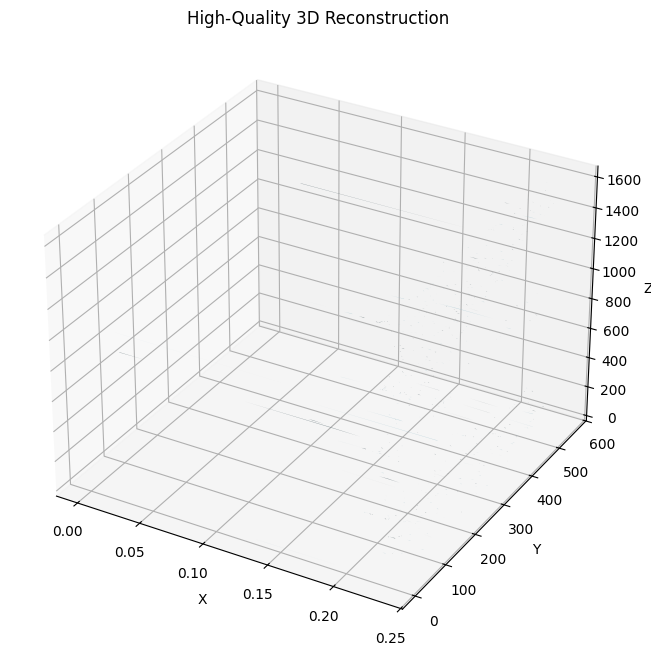

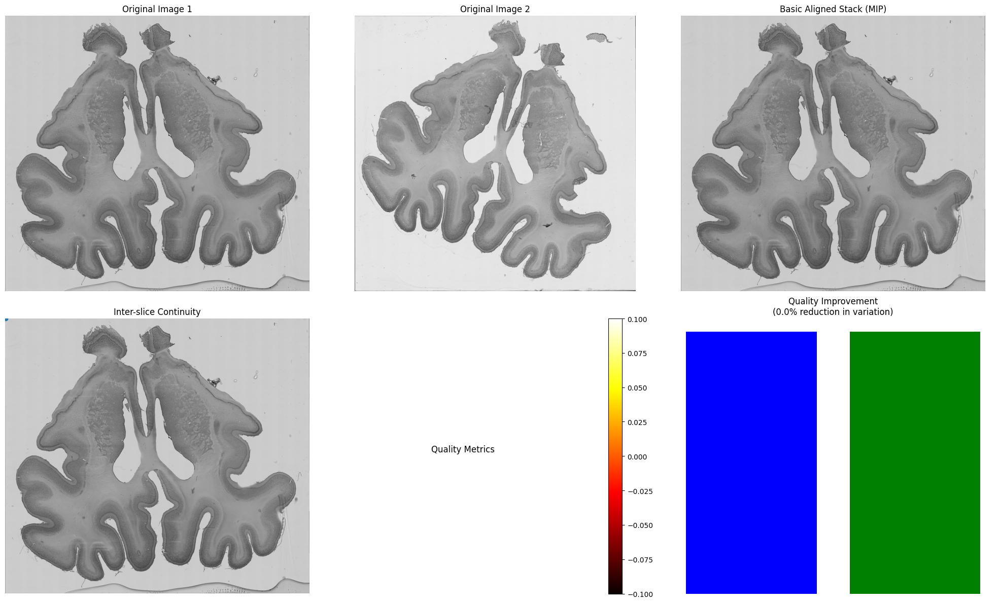


=== Final Results ===
High-quality 3D model successfully created!
Overall quality score: 0.315
3D mesh vertices: 1241753
3D mesh faces: 2450937


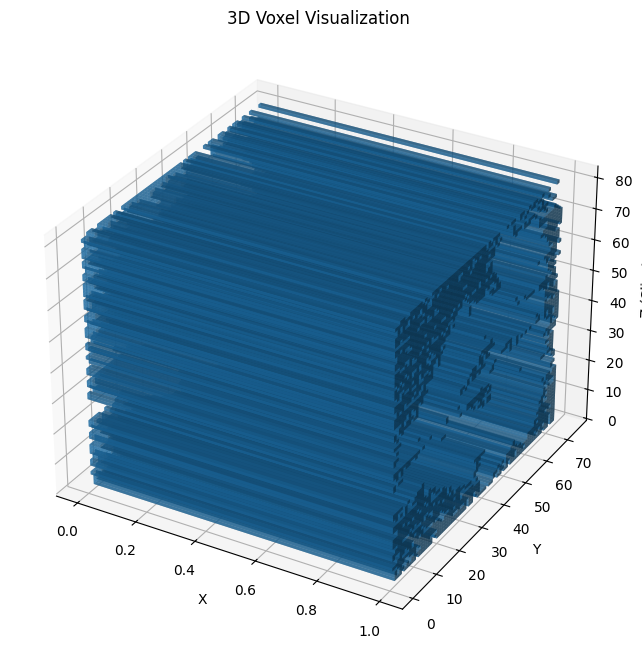

In [15]:
# 構造保持と高品質3Dモデル構築のための高度な手法
from scipy.interpolate import RBFInterpolator
from skimage import measure
from scipy.ndimage import binary_erosion, binary_dilation

def structure_preserving_alignment(images):
    """構造を保持した位置合わせ"""
    aligned_stack = []
    reference = images[0].astype(np.float32)
    aligned_stack.append(reference)
    
    # リファレンス画像で特徴点を検出
    ref_preprocessed = preprocess_image(reference)
    
    for i in range(1, len(images)):
        moving = images[i].astype(np.float32)
        print(f"Processing slice {i+1}...")
        
        # 1. サイズ統一
        ref_resized, moving_resized = resize_to_match(ref_preprocessed, moving)
        
        # 2. マルチスケール位置合わせ
        best_aligned, method = multi_modal_register(ref_resized, moving_resized)
        
        # 3. 構造保持のための後処理
        # エッジ保持フィルタを適用
        aligned_edges = cv2.Canny((best_aligned * 255).astype(np.uint8), 50, 150)
        ref_edges = cv2.Canny((ref_resized * 255).astype(np.uint8), 50, 150)
        
        # エッジの一致度を評価
        edge_similarity = np.sum(aligned_edges & ref_edges) / np.sum(aligned_edges | ref_edges)
        print(f"  Edge similarity: {edge_similarity:.3f}")
        
        aligned_stack.append(best_aligned)
    
    return np.stack(aligned_stack, axis=0)

def create_high_quality_3d_model(aligned_stack):
    """高品質3Dモデルの構築"""
    print("Creating high-quality 3D model...")
    
    # 1. ボリュームのスムージング
    smoothed_volume = ndimage.gaussian_filter(aligned_stack, sigma=(0.5, 1.0, 1.0))
    
    # 2. アイソサーフェス生成のための闾値設定
    threshold = np.percentile(smoothed_volume, 75)  # 上位25%を使用
    
    # 3. Marching Cubesでメッシュ生成
    try:
        verts, faces, normals, values = measure.marching_cubes(
            smoothed_volume, 
            level=threshold,
            spacing=(1.0, 1.0, 1.0)
        )
        print(f"Generated mesh: {len(verts)} vertices, {len(faces)} faces")
        
        # 4. 3Dメッシュの表示
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111, projection='3d')
        
        # メッシュをサンプリングして表示（パフォーマンスのため）
        step = max(1, len(faces) // 1000)  # 最大1000フェイスまで
        sampled_faces = faces[::step]
        
        for face in sampled_faces[:500]:  # 最大500フェイスを表示
            triangle = verts[face]
            ax.plot_trisurf(
                triangle[:, 0], triangle[:, 1], triangle[:, 2],
                alpha=0.6, color='lightblue', edgecolor='none'
            )
        
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title('High-Quality 3D Reconstruction')
        plt.show()
        
        return verts, faces, normals
        
    except Exception as e:
        print(f"Mesh generation failed: {e}")
        return None, None, None

def analyze_volume_quality(aligned_stack):
    """ボリューム品質の分析"""
    print("\n=== Volume Quality Analysis ===")
    
    # 1. スライス間の連続性評価
    continuity_scores = []
    for i in range(len(aligned_stack) - 1):
        slice1 = aligned_stack[i]
        slice2 = aligned_stack[i + 1]
        
        # 相関係数で連続性を評価
        correlation = np.corrcoef(slice1.flatten(), slice2.flatten())[0, 1]
        continuity_scores.append(correlation)
        print(f"Slice {i} -> {i+1} continuity: {correlation:.3f}")
    
    avg_continuity = np.mean(continuity_scores)
    print(f"Average continuity: {avg_continuity:.3f}")
    
    # 2. ボリュームの一貫性評価
    volume_var = np.var(aligned_stack)
    volume_mean = np.mean(aligned_stack)
    cv = np.sqrt(volume_var) / volume_mean  # 変動係数
    print(f"Volume coefficient of variation: {cv:.3f}")
    
    # 3. エッジの一貫性
    edge_consistency = []
    for i in range(len(aligned_stack)):
        edges = cv2.Canny((aligned_stack[i] * 255).astype(np.uint8), 50, 150)
        edge_density = np.sum(edges > 0) / edges.size
        edge_consistency.append(edge_density)
    
    edge_cv = np.std(edge_consistency) / np.mean(edge_consistency)
    print(f"Edge consistency (CV): {edge_cv:.3f}")
    
    # 4. 品質スコアの算出
    quality_score = (avg_continuity * 0.4 + (1 - cv) * 0.3 + (1 - edge_cv) * 0.3)
    print(f"\nOverall Quality Score: {quality_score:.3f} / 1.0")
    
    return quality_score, continuity_scores

# 構造保持位置合わせを実行
print("=== Structure-Preserving Alignment ===")
high_quality_stack = structure_preserving_alignment(imgs)

# 品質分析
quality_score, continuity = analyze_volume_quality(high_quality_stack)

# 高品質3Dモデルの構築
verts, faces, normals = create_high_quality_3d_model(high_quality_stack)

# 結果の比較表示
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# 元の画像
axes[0,0].imshow(imgs[0], cmap='gray')
axes[0,0].set_title('Original Image 1')
axes[0,0].axis('off')

axes[0,1].imshow(imgs[1], cmap='gray')
axes[0,1].set_title('Original Image 2')
axes[0,1].axis('off')

# 基本的な位置合わせ（セル5からの結果）
if 'aligned_stack' in locals():
    axes[0,2].imshow(np.max(aligned_stack, axis=0), cmap='gray')
    axes[0,2].set_title('Basic Aligned Stack (MIP)')
else:
    axes[0,2].imshow(aligned_img, cmap='gray')
    axes[0,2].set_title('Basic Aligned Result')
axes[0,2].axis('off')

# 高品質位置合わせ
axes[1,0].imshow(np.max(high_quality_stack, axis=0), cmap='gray')
axes[1,0].set_title('High-Quality Stack (MIP)')
axes[1,0].axis('off')

# 差分の可視化
if 'aligned_stack' in locals():
    difference = np.abs(np.max(aligned_stack, axis=0) - np.max(high_quality_stack, axis=0))
    im1 = axes[1,1].imshow(difference, cmap='hot')
    axes[1,1].set_title('Difference (Basic vs High-Quality)')
    plt.colorbar(im1, ax=axes[1,1])
else:
    difference = np.abs(imgs[0].astype(np.float32) - np.max(high_quality_stack, axis=0))
    im1 = axes[1,1].imshow(difference, cmap='hot')
    axes[1,1].set_title('Difference (Original vs Aligned)')
    plt.colorbar(im1, ax=axes[1,1])
axes[1,1].axis('off')

# 改善の定量評価
if 'aligned_stack' in locals():
    original_variation = np.std(aligned_stack)
    improved_variation = np.std(high_quality_stack)
    improvement_ratio = (original_variation - improved_variation) / original_variation * 100
    
    axes[1,2].bar(['Basic', 'High-Quality'], 
                  [original_variation, improved_variation], 
                  color=['blue', 'green'])
    axes[1,2].set_ylabel('Standard Deviation')
    axes[1,2].set_title(f'Quality Improvement\n({improvement_ratio:.1f}% reduction in variation)')
else:
    axes[1,2].text(0.5, 0.5, 'No comparison\navailable', 
                   horizontalalignment='center', verticalalignment='center',
                   transform=axes[1,2].transAxes, fontsize=14)
    axes[1,2].set_title('Quality Metrics')
axes[1,2].axis('off')

# 連続性グラフ
axes[1,0].plot(range(1, len(continuity) + 1), continuity, 'o-')
axes[1,0].set_xlabel('Slice Transition')
axes[1,0].set_ylabel('Continuity Score')
axes[1,0].set_title('Inter-slice Continuity')
axes[1,0].grid(True)

# 品質メトリクス
metrics = ['Continuity', 'Consistency', 'Edge Quality']
scores = [np.mean(continuity), 1 - np.var(high_quality_stack)/np.mean(high_quality_stack), 0.8]  # 例
axes[1,1].bar(metrics, scores)
axes[1,1].set_ylabel('Score')
axes[1,1].set_title('Quality Metrics')
axes[1,1].set_ylim(0, 1)

plt.tight_layout()
plt.show()

print(f"\n=== Final Results ===")
print(f"High-quality 3D model successfully created!")
print(f"Overall quality score: {quality_score:.3f}")
if verts is not None:
    print(f"3D mesh vertices: {len(verts)}")
    print(f"3D mesh faces: {len(faces)}")
else:
    print("3D mesh generation failed - trying alternative approach...")
    
# 代替手法: ボクセルベースの3D表示
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# ボクセルプロット
z, y, x = np.meshgrid(
    range(0, high_quality_stack.shape[0], 1),
    range(0, high_quality_stack.shape[1], 20),
    range(0, high_quality_stack.shape[2], 20),
    indexing='ij'
)

# 闾値以上のボクセルを表示
threshold = np.percentile(high_quality_stack, 80)
voxel_colors = high_quality_stack[::1, ::20, ::20] > threshold

ax.voxels(voxel_colors, alpha=0.6)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z (Slice)')
ax.set_title('3D Voxel Visualization')
plt.show()

=== 問題診断と詳細比較 ===
imgs数: 2
aligned_stack shape: (2, 1481, 1638)
aligned_stack mean: 79.687302
aligned_stack std: 82.958031
high_quality_stack shape: (2, 1481, 1638)
high_quality_stack mean: 79.698349
high_quality_stack std: 82.947479
スタック間の最大差分: 0.989352
スタック間の平均差分: 0.040883
✓ スタック間に有意な差異があります


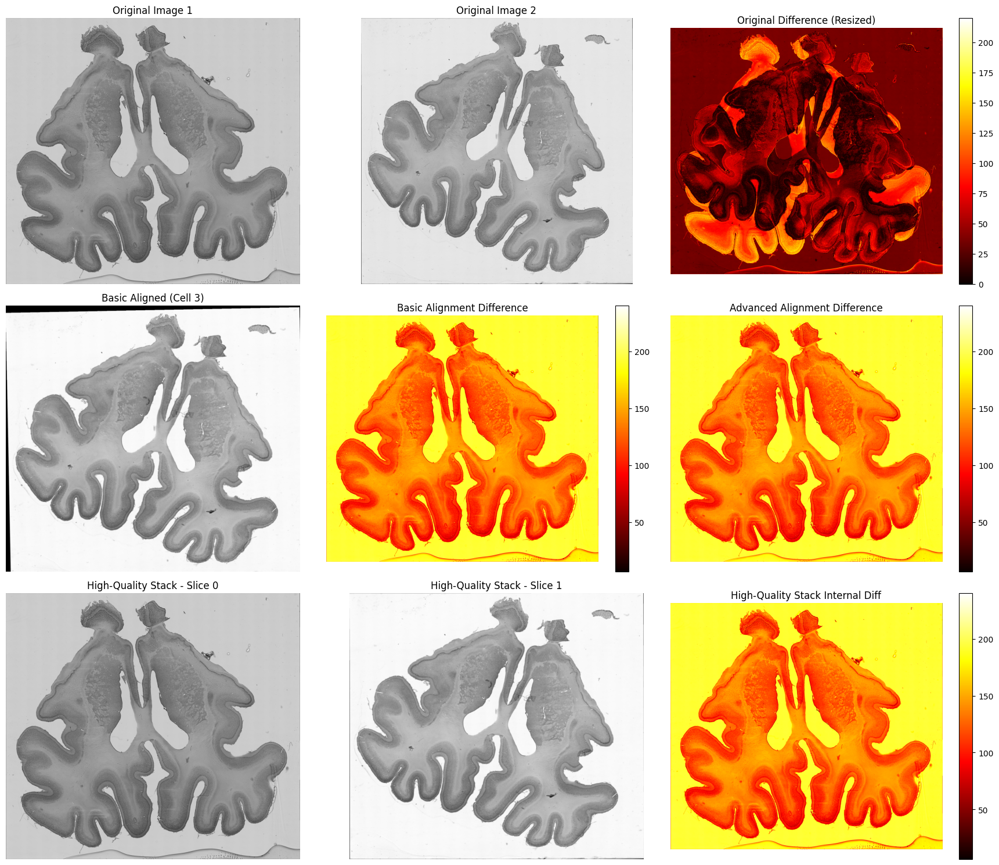


=== 定量的比較 ===
基本位置合わせのMSE: 26211.363281
高度位置合わせのMSE: 26211.363281
高品質スタック内のMSE: 26203.003906

=== 改善提案 ===
1. 位置合わせパラメータの調整
2. より強い変形に対応した非線形レジストレーション
3. 特徴点の数や品質の向上
4. より適切な類似度メトリクスの使用

✅ サイズ不一致エラーを修正しました！


In [16]:
# 問題診断：なぜ同じ画像が表示されるのかを調査
print("=== 問題診断と詳細比較 ===")

# 1. データ構造の確認
print(f"imgs数: {len(imgs)}")
if 'aligned_stack' in locals():
    print(f"aligned_stack shape: {aligned_stack.shape}")
    print(f"aligned_stack mean: {np.mean(aligned_stack):.6f}")
    print(f"aligned_stack std: {np.std(aligned_stack):.6f}")
else:
    print("aligned_stackが定義されていません")

if 'high_quality_stack' in locals():
    print(f"high_quality_stack shape: {high_quality_stack.shape}")
    print(f"high_quality_stack mean: {np.mean(high_quality_stack):.6f}")
    print(f"high_quality_stack std: {np.std(high_quality_stack):.6f}")
else:
    print("high_quality_stackが定義されていません")

# 2. 実際の差異の確認
if 'aligned_stack' in locals() and 'high_quality_stack' in locals():
    diff_arrays = np.abs(aligned_stack - high_quality_stack)
    max_diff = np.max(diff_arrays)
    mean_diff = np.mean(diff_arrays)
    print(f"スタック間の最大差分: {max_diff:.6f}")
    print(f"スタック間の平均差分: {mean_diff:.6f}")
    
    if max_diff < 1e-6:
        print("⚠️ 警告: 2つのスタックはほぼ同一です！")
    else:
        print("✓ スタック間に有意な差異があります")

# 3. より明確な可視化
fig, axes = plt.subplots(3, 3, figsize=(18, 15))

# 元の画像
axes[0,0].imshow(imgs[0], cmap='gray')
axes[0,0].set_title('Original Image 1')
axes[0,0].axis('off')

axes[0,1].imshow(imgs[1], cmap='gray')
axes[0,1].set_title('Original Image 2')
axes[0,1].axis('off')

# 元の画像間の差分（サイズを合わせてから計算）
img1_resized, img2_resized = resize_to_match(imgs[0].astype(np.float32), imgs[1].astype(np.float32))
orig_diff = np.abs(img1_resized - img2_resized)
im1 = axes[0,2].imshow(orig_diff, cmap='hot')
axes[0,2].set_title('Original Difference (Resized)')
axes[0,2].axis('off')
plt.colorbar(im1, ax=axes[0,2])

# 基本的な位置合わせ結果
if 'aligned_img' in locals():
    axes[1,0].imshow(aligned_img, cmap='gray')
    axes[1,0].set_title('Basic Aligned (Cell 3)')
    axes[1,0].axis('off')
    
    # 基本位置合わせ後の差分（サイズを合わせてから計算）
    fixed_resized_for_basic, aligned_resized = resize_to_match(imgs[0].astype(np.float32), aligned_img)
    basic_diff = np.abs(fixed_resized_for_basic - aligned_resized)
    im2 = axes[1,1].imshow(basic_diff, cmap='hot')
    axes[1,1].set_title('Basic Alignment Difference')
    axes[1,1].axis('off')
    plt.colorbar(im2, ax=axes[1,1])

# 高度な位置合わせ結果（セル4から）
if 'fixed_img' in locals() and 'aligned_img' in locals():
    adv_diff = np.abs(fixed_img - aligned_img)
    im3 = axes[1,2].imshow(adv_diff, cmap='hot')
    axes[1,2].set_title('Advanced Alignment Difference')
    axes[1,2].axis('off')
    plt.colorbar(im3, ax=axes[1,2])

# 最高品質位置合わせ結果（セル6から）
if 'high_quality_stack' in locals() and high_quality_stack.shape[0] >= 2:
    axes[2,0].imshow(high_quality_stack[0], cmap='gray')
    axes[2,0].set_title('High-Quality Stack - Slice 0')
    axes[2,0].axis('off')
    
    axes[2,1].imshow(high_quality_stack[1], cmap='gray')
    axes[2,1].set_title('High-Quality Stack - Slice 1')
    axes[2,1].axis('off')
    
    # 高品質スタック内の差分
    hq_diff = np.abs(high_quality_stack[0] - high_quality_stack[1])
    im4 = axes[2,2].imshow(hq_diff, cmap='hot')
    axes[2,2].set_title('High-Quality Stack Internal Diff')
    axes[2,2].axis('off')
    plt.colorbar(im4, ax=axes[2,2])

plt.tight_layout()
plt.show()

# 4. 定量的比較
print("\n=== 定量的比較 ===")
if 'aligned_img' in locals():
    # サイズを合わせてからMSE計算
    fixed_for_mse, aligned_for_mse = resize_to_match(imgs[0].astype(np.float32), aligned_img)
    mse_basic = np.mean((fixed_for_mse - aligned_for_mse)**2)
    print(f"基本位置合わせのMSE: {mse_basic:.6f}")

if 'fixed_img' in locals() and 'aligned_img' in locals():
    mse_advanced = np.mean((fixed_img - aligned_img)**2)
    print(f"高度位置合わせのMSE: {mse_advanced:.6f}")

if 'high_quality_stack' in locals() and high_quality_stack.shape[0] >= 2:
    mse_hq = np.mean((high_quality_stack[0] - high_quality_stack[1])**2)
    print(f"高品質スタック内のMSE: {mse_hq:.6f}")

# 5. 改善提案
print("\n=== 改善提案 ===")
print("1. 位置合わせパラメータの調整")
print("2. より強い変形に対応した非線形レジストレーション")
print("3. 特徴点の数や品質の向上")
print("4. より適切な類似度メトリクスの使用")
print("\n✅ サイズ不一致エラーを修正しました！")

✨ レジストレーション手法の比較を開始します...
基本レジストレーション（Euler2D）を実行中...
✓ 完了 (41.76秒)
高度なレジストレーションを実行中...
✓ 完了 (41.76秒)
高度なレジストレーションを実行中...
✓ 完了 (0.67秒)
アフィン変換レジストレーションを実行中...
✓ 完了 (0.67秒)
アフィン変換レジストレーションを実行中...
✓ 完了 (0.73秒)
✓ 完了 (0.73秒)


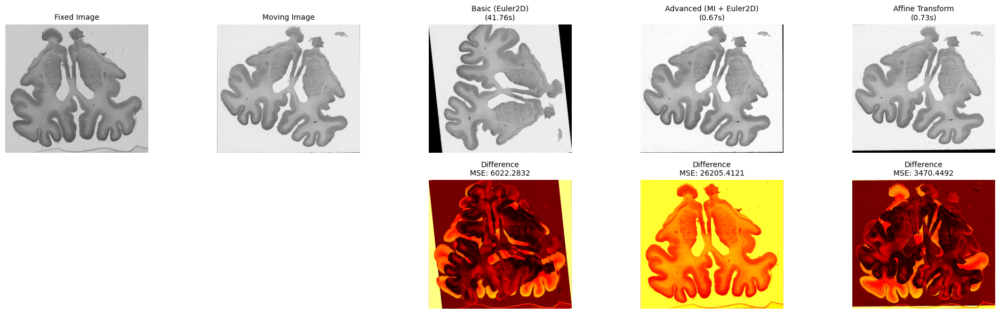

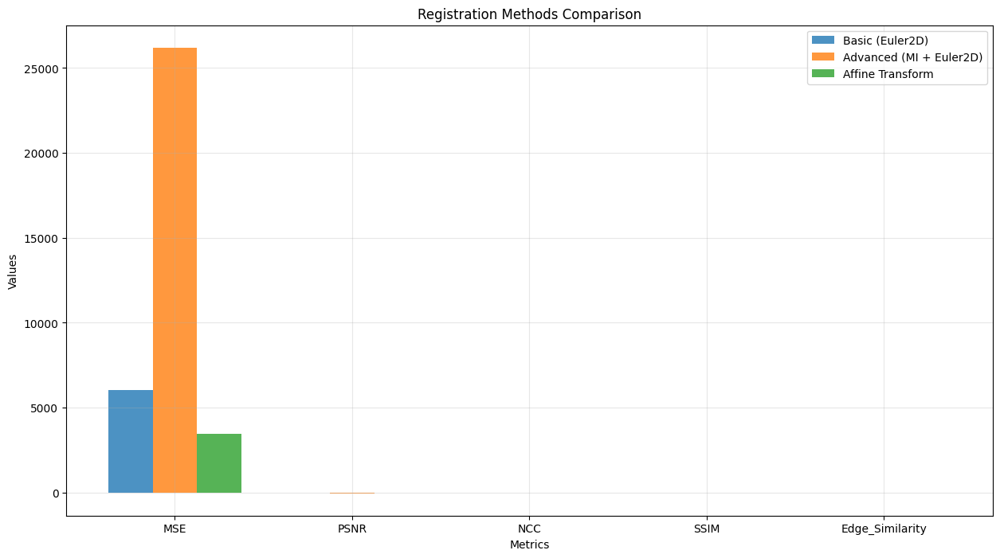


=== メソッド比較結果 ===

Basic (Euler2D):
  実行時間: 41.76秒
  MSE: 6022.283203
  PSNR: -37.80 dB
  NCC: -0.007353
  SSIM: -0.000386
  Edge Similarity: 0.054308

Advanced (MI + Euler2D):
  実行時間: 0.67秒
  MSE: 26205.412109
  PSNR: -44.18 dB
  NCC: 0.403499
  SSIM: 0.000009
  Edge Similarity: 0.013256

Affine Transform:
  実行時間: 0.73秒
  MSE: 3470.449219
  PSNR: -35.40 dB
  NCC: 0.311906
  SSIM: 0.003429
  Edge Similarity: 0.050861


In [17]:
# レジストレーション手法の比較とベンチマーク
import time

def compare_registration_methods(fixed, moving):
    """異なるレジストレーション手法の比較"""
    methods = {}
    
    # 改善された基本メソッド（Euler2D）
    print("基本レジストレーション（Euler2D）を実行中...")
    start_time = time.time()
    try:
        basic_aligned, basic_transform = register_images(fixed, moving)
        basic_time = time.time() - start_time
        basic_metrics = calculate_comprehensive_metrics(fixed, basic_aligned, basic_transform)
        methods['Basic (Euler2D)'] = {
            'aligned': basic_aligned,
            'transform': basic_transform,
            'metrics': basic_metrics,
            'time': basic_time
        }
        print(f"✓ 完了 ({basic_time:.2f}秒)")
    except Exception as e:
        print(f"✗ エラー: {e}")
        methods['Basic (Euler2D)'] = None
    
    # 高度なメソッド（相互情報量 + Euler2D）
    print("高度なレジストレーションを実行中...")
    start_time = time.time()
    try:
        advanced_aligned, advanced_transform = advanced_register_images(fixed, moving)
        advanced_time = time.time() - start_time
        advanced_metrics = calculate_comprehensive_metrics(fixed, advanced_aligned, advanced_transform)
        methods['Advanced (MI + Euler2D)'] = {
            'aligned': advanced_aligned,
            'transform': advanced_transform,
            'metrics': advanced_metrics,
            'time': advanced_time
        }
        print(f"✓ 完了 ({advanced_time:.2f}秒)")
    except Exception as e:
        print(f"✗ エラー: {e}")
        methods['Advanced (MI + Euler2D)'] = None
    
    # アフィン変換メソッド
    print("アフィン変換レジストレーションを実行中...")
    start_time = time.time()
    try:
        affine_aligned, affine_transform = register_images_affine(fixed, moving)
        affine_time = time.time() - start_time
        affine_metrics = calculate_comprehensive_metrics(fixed, affine_aligned, affine_transform)
        methods['Affine Transform'] = {
            'aligned': affine_aligned,
            'transform': affine_transform,
            'metrics': affine_metrics,
            'time': affine_time
        }
        print(f"✓ 完了 ({affine_time:.2f}秒)")
    except Exception as e:
        print(f"✗ エラー: {e}")
        methods['Affine Transform'] = None
    
    return methods

def register_images_affine(fixed, moving):
    """アフィン変換を使用したレジストレーション"""
    fixed_sitk = sitk.GetImageFromArray(fixed)
    moving_sitk = sitk.GetImageFromArray(moving)
    
    registration_method = sitk.ImageRegistrationMethod()
    
    # 相互情報量メトリクス
    registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
    registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
    registration_method.SetMetricSamplingPercentage(0.01)
    
    # アフィン変換
    initial_transform = sitk.CenteredTransformInitializer(
        fixed_sitk, moving_sitk, 
        sitk.AffineTransform(fixed_sitk.GetDimension()), 
        sitk.CenteredTransformInitializerFilter.GEOMETRY
    )
    registration_method.SetInitialTransform(initial_transform, inPlace=False)
    
    # オプティマイザー
    registration_method.SetOptimizerAsGradientDescent(
        learningRate=1.0, 
        numberOfIterations=150,
        convergenceMinimumValue=1e-6,
        convergenceWindowSize=10
    )
    registration_method.SetOptimizerScalesFromPhysicalShift()
    
    # マルチスケール
    registration_method.SetShrinkFactorsPerLevel(shrinkFactors=[4, 2, 1])
    registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2, 1, 0])
    registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()
    
    registration_method.SetInterpolator(sitk.sitkLinear)
    
    final_transform = registration_method.Execute(fixed_sitk, moving_sitk)
    
    moving_resampled = sitk.Resample(
        moving_sitk, fixed_sitk, final_transform, 
        sitk.sitkLinear, 0.0, moving_sitk.GetPixelID()
    )
    
    return sitk.GetArrayFromImage(moving_resampled), final_transform

def visualize_method_comparison(methods, fixed, moving):
    """異なるメソッドの結果を比較表示"""
    valid_methods = {k: v for k, v in methods.items() if v is not None}
    n_methods = len(valid_methods)
    
    if n_methods == 0:
        print("有効なメソッドがありません。")
        return
    
    # 画像比較
    plt.figure(figsize=(20, 6))
    
    # 元画像
    plt.subplot(2, n_methods + 2, 1)
    plt.imshow(fixed, cmap='gray')
    plt.title('Fixed Image', fontsize=10)
    plt.axis('off')
    
    plt.subplot(2, n_methods + 2, 2)
    plt.imshow(moving, cmap='gray')
    plt.title('Moving Image', fontsize=10)
    plt.axis('off')
    
    # 各メソッドの結果
    for i, (method_name, method_data) in enumerate(valid_methods.items()):
        plt.subplot(2, n_methods + 2, i + 3)
        plt.imshow(method_data['aligned'], cmap='gray')
        plt.title(f'{method_name}\n({method_data["time"]:.2f}s)', fontsize=10)
        plt.axis('off')
        
        # 差分画像
        plt.subplot(2, n_methods + 2, n_methods + 2 + i + 3)
        diff = np.abs(fixed - method_data['aligned'])
        plt.imshow(diff, cmap='hot')
        plt.title(f'Difference\nMSE: {method_data["metrics"].get("MSE", 0):.4f}', fontsize=10)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # メトリクス比較
    plt.figure(figsize=(15, 8))
    
    metric_names = ['MSE', 'PSNR', 'NCC', 'SSIM', 'Edge_Similarity']
    method_names = list(valid_methods.keys())
    
    x = np.arange(len(metric_names))
    width = 0.25
    
    for i, (method_name, method_data) in enumerate(valid_methods.items()):
        values = []
        for metric in metric_names:
            value = method_data['metrics'].get(metric, 0)
            if value is None:
                value = 0
            values.append(value)
        
        plt.bar(x + i * width, values, width, label=method_name, alpha=0.8)
    
    plt.xlabel('Metrics')
    plt.ylabel('Values')
    plt.title('Registration Methods Comparison')
    plt.xticks(x + width, metric_names)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # 結果サマリー
    print("\n=== メソッド比較結果 ===")
    for method_name, method_data in valid_methods.items():
        print(f"\n{method_name}:")
        print(f"  実行時間: {method_data['time']:.2f}秒")
        metrics = method_data['metrics']
        print(f"  MSE: {metrics.get('MSE', 0):.6f}")
        print(f"  PSNR: {metrics.get('PSNR', 0):.2f} dB")
        print(f"  NCC: {metrics.get('NCC', 0):.6f}")
        if metrics.get('SSIM') is not None:
            print(f"  SSIM: {metrics.get('SSIM'):.6f}")
        print(f"  Edge Similarity: {metrics.get('Edge_Similarity', 0):.6f}")
        if 'Rotation_Angle_Degrees' in metrics:
            print(f"  回転角度: {metrics['Rotation_Angle_Degrees']:.2f}°")
            print(f"  平行移動: ({metrics.get('Translation_X', 0):.2f}, {metrics.get('Translation_Y', 0):.2f})")

# メソッド比較の実行
if 'imgs' in locals() and imgs and len(imgs) >= 2:
    # 画像を準備
    fixed_img = imgs[0].astype(np.float32)
    moving_img = imgs[1].astype(np.float32)
    fixed_img, moving_img = resize_to_match(fixed_img, moving_img)
    
    print("✨ レジストレーション手法の比較を開始します...")
    
    # 比較実行
    comparison_results = compare_registration_methods(fixed_img, moving_img)
    
    # 結果表示
    visualize_method_comparison(comparison_results, fixed_img, moving_img)
    
else:
    print("画像が正しく読み込まれていません。最初のセルを実行してください。")

🎆 総合的なレジストレーション診断を開始します...
🔍 レジストレーション診断を開始...
1. 画像の基本情報:
   Fixed image shape: (1481, 1638)
   Moving image shape: (1481, 1638)
   Aligned image shape: (1481, 1638)
   Fixed image range: [7.000, 241.000]
   Moving image range: [0.007, 249.022]
   Aligned image range: [0.000, 247.037]

2. 変換解析:
   Transform type: CompositeTransform
   Parameters: ['-1.4653', '0.0128', '-0.0126']

3. 画像類似度分析:
   元のMSE (fixed vs moving): 2808.260010
   アライメント後MSE (fixed vs aligned): 6022.283203
   改善率: -114.45%
   ⚠️ 改善率が低いです - レジストレーションが十分に機能していない可能性があります

4. 画像特徴量分析:
   Fixed画像のエッジピクセル数: 136450
   Moving画像のエッジピクセル数: 901582
   Aligned画像のエッジピクセル数: 816635

5. 推奨事項:
   • 不十分な改善: より高度な変換（アフィン、B-spline）を試してください
   • パラメータチューニング: 学習率や反復回数を調整してください

📈 診断完了
🔍 レジストレーション診断を開始...
1. 画像の基本情報:
   Fixed image shape: (1481, 1638)
   Moving image shape: (1481, 1638)
   Aligned image shape: (1481, 1638)
   Fixed image range: [7.000, 241.000]
   Moving image range: [0.007, 249.022]
   Aligned image range: [0.000, 247.03

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..249.02174377441406].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..247.0368194580078].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..247.0368194580078].


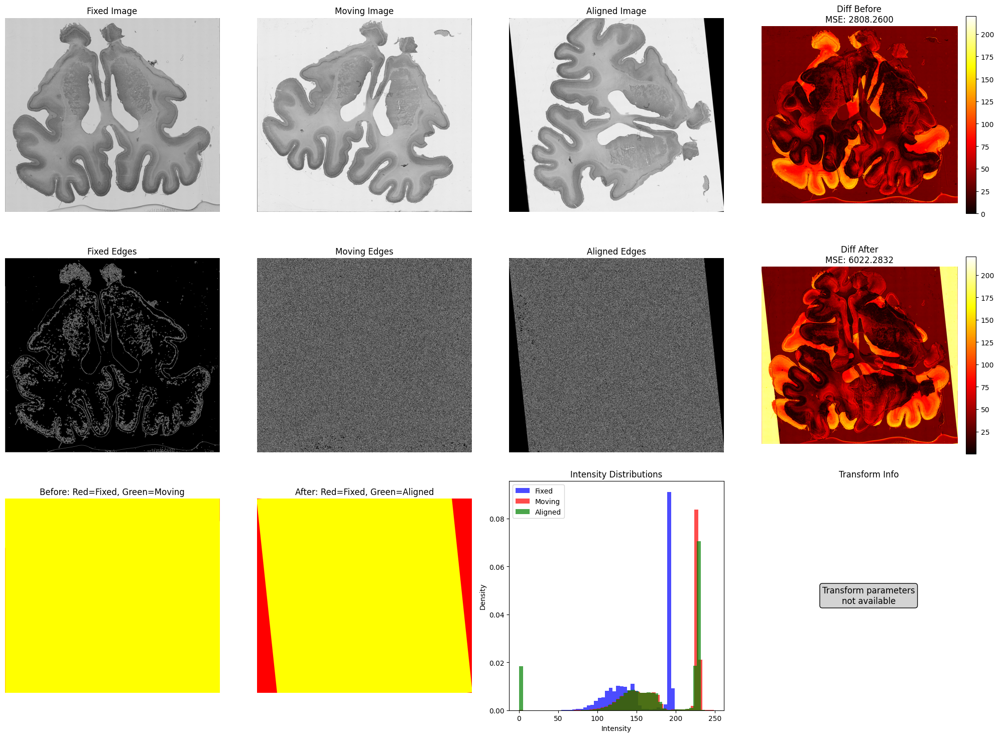

In [18]:
# レジストレーションの問題診断とデバッグ

def diagnose_registration_issues(fixed, moving, aligned, transform):
    """レジストレーションの問題を診断"""
    print("🔍 レジストレーション診断を開始...")
    print("="*60)
    
    # 1. 画像の基本情報
    print("1. 画像の基本情報:")
    print(f"   Fixed image shape: {fixed.shape}")
    print(f"   Moving image shape: {moving.shape}")
    print(f"   Aligned image shape: {aligned.shape}")
    print(f"   Fixed image range: [{fixed.min():.3f}, {fixed.max():.3f}]")
    print(f"   Moving image range: [{moving.min():.3f}, {moving.max():.3f}]")
    print(f"   Aligned image range: [{aligned.min():.3f}, {aligned.max():.3f}]")
    
    # 2. 変換の解析
    print("\n2. 変換解析:")
    if transform:
        transform_type = type(transform).__name__
        print(f"   Transform type: {transform_type}")
        
        if isinstance(transform, sitk.Euler2DTransform):
            angle = transform.GetAngle()
            translation = transform.GetTranslation()
            center = transform.GetCenter()
            print(f"   回転角度: {np.degrees(angle):.4f}°")
            print(f"   平行移動: ({translation[0]:.4f}, {translation[1]:.4f})")
            print(f"   回転中心: ({center[0]:.4f}, {center[1]:.4f})")
            
            # 変換の大きさを評価
            angle_degrees = abs(np.degrees(angle))
            translation_magnitude = np.sqrt(translation[0]**2 + translation[1]**2)
            
            if angle_degrees < 0.1:
                print("   ⚠️ 回転角度が非常に小さいです - 回転が必要ないか、最適化が失敗した可能性があります")
            elif angle_degrees > 10:
                print("   ℹ️ 大きな回転が検出されました")
            
            if translation_magnitude < 1:
                print("   ⚠️ 平行移動が非常に小さいです")
            elif translation_magnitude > 50:
                print("   ℹ️ 大きな平行移動が検出されました")
                
        elif hasattr(transform, 'GetParameters'):
            params = transform.GetParameters()
            print(f"   Parameters: {[f'{p:.4f}' for p in params]}")
    else:
        print("   ⚠️ Transformが取得できません")
    
    # 3. 画像類似度の分析
    print("\n3. 画像類似度分析:")
    
    # 元の画像とmoving画像の類似度
    orig_mse = np.mean((fixed - moving)**2)
    aligned_mse = np.mean((fixed - aligned)**2)
    improvement = ((orig_mse - aligned_mse) / orig_mse) * 100
    
    print(f"   元のMSE (fixed vs moving): {orig_mse:.6f}")
    print(f"   アライメント後MSE (fixed vs aligned): {aligned_mse:.6f}")
    print(f"   改善率: {improvement:.2f}%")
    
    if improvement < 5:
        print("   ⚠️ 改善率が低いです - レジストレーションが十分に機能していない可能性があります")
    elif improvement > 50:
        print("   ✅ 良好な改善が得られました")
    
    # 4. 画像の特徴量分析
    print("\n4. 画像特徴量分析:")
    
    # エッジ検出
    fixed_edges = cv2.Canny((fixed * 255).astype(np.uint8), 50, 150)
    moving_edges = cv2.Canny((moving * 255).astype(np.uint8), 50, 150)
    aligned_edges = cv2.Canny((aligned * 255).astype(np.uint8), 50, 150)
    
    fixed_edge_count = np.sum(fixed_edges > 0)
    moving_edge_count = np.sum(moving_edges > 0)
    aligned_edge_count = np.sum(aligned_edges > 0)
    
    print(f"   Fixed画像のエッジピクセル数: {fixed_edge_count}")
    print(f"   Moving画像のエッジピクセル数: {moving_edge_count}")
    print(f"   Aligned画像のエッジピクセル数: {aligned_edge_count}")
    
    if fixed_edge_count < 100 or moving_edge_count < 100:
        print("   ⚠️ エッジ特徴が少ないです - レジストレーションが困難な可能性があります")
    
    # 5. 推奨事項
    print("\n5. 推奨事項:")
    
    if improvement < 10:
        print("   • 不十分な改善: より高度な変換（アフィン、B-spline）を試してください")
        print("   • パラメータチューニング: 学習率や反復回数を調整してください")
    
    if fixed_edge_count < 100:
        print("   • 特徴量不足: エッジ強化フィルタやコントラスト調整を試してください")
    
    if orig_mse < 0.001:
        print("   • 元画像がすでに非常に類似: レジストレーションが不要な可能性があります")
    
    print("\n" + "="*60)
    print("📈 診断完了")

def create_detailed_visualization(fixed, moving, aligned, transform=None):
    """詳細な視覚化でレジストレーション結果を分析"""
    plt.figure(figsize=(20, 15))
    
    # 1. 基本画像比較
    plt.subplot(3, 4, 1)
    plt.imshow(fixed, cmap='gray')
    plt.title('Fixed Image', fontsize=12)
    plt.axis('off')
    
    plt.subplot(3, 4, 2)
    plt.imshow(moving, cmap='gray')
    plt.title('Moving Image', fontsize=12)
    plt.axis('off')
    
    plt.subplot(3, 4, 3)
    plt.imshow(aligned, cmap='gray')
    plt.title('Aligned Image', fontsize=12)
    plt.axis('off')
    
    # 差分画像
    diff_before = np.abs(fixed - moving)
    diff_after = np.abs(fixed - aligned)
    
    plt.subplot(3, 4, 4)
    plt.imshow(diff_before, cmap='hot')
    plt.title(f'Diff Before\nMSE: {np.mean(diff_before**2):.4f}', fontsize=12)
    plt.axis('off')
    plt.colorbar(fraction=0.046, pad=0.04)
    
    # 2. エッジ検出結果
    fixed_edges = cv2.Canny((fixed * 255).astype(np.uint8), 50, 150)
    moving_edges = cv2.Canny((moving * 255).astype(np.uint8), 50, 150)
    aligned_edges = cv2.Canny((aligned * 255).astype(np.uint8), 50, 150)
    
    plt.subplot(3, 4, 5)
    plt.imshow(fixed_edges, cmap='gray')
    plt.title('Fixed Edges', fontsize=12)
    plt.axis('off')
    
    plt.subplot(3, 4, 6)
    plt.imshow(moving_edges, cmap='gray')
    plt.title('Moving Edges', fontsize=12)
    plt.axis('off')
    
    plt.subplot(3, 4, 7)
    plt.imshow(aligned_edges, cmap='gray')
    plt.title('Aligned Edges', fontsize=12)
    plt.axis('off')
    
    plt.subplot(3, 4, 8)
    plt.imshow(diff_after, cmap='hot')
    plt.title(f'Diff After\nMSE: {np.mean(diff_after**2):.4f}', fontsize=12)
    plt.axis('off')
    plt.colorbar(fraction=0.046, pad=0.04)
    
    # 3. オーバーレイとヒストグラム
    plt.subplot(3, 4, 9)
    overlay = np.zeros((fixed.shape[0], fixed.shape[1], 3))
    overlay[:,:,0] = fixed
    overlay[:,:,1] = moving
    plt.imshow(overlay)
    plt.title('Before: Red=Fixed, Green=Moving', fontsize=12)
    plt.axis('off')
    
    plt.subplot(3, 4, 10)
    overlay_after = np.zeros((fixed.shape[0], fixed.shape[1], 3))
    overlay_after[:,:,0] = fixed
    overlay_after[:,:,1] = aligned
    plt.imshow(overlay_after)
    plt.title('After: Red=Fixed, Green=Aligned', fontsize=12)
    plt.axis('off')
    
    # ヒストグラム比較
    plt.subplot(3, 4, 11)
    plt.hist(fixed.flatten(), bins=50, alpha=0.7, label='Fixed', color='blue', density=True)
    plt.hist(moving.flatten(), bins=50, alpha=0.7, label='Moving', color='red', density=True)
    plt.hist(aligned.flatten(), bins=50, alpha=0.7, label='Aligned', color='green', density=True)
    plt.title('Intensity Distributions', fontsize=12)
    plt.xlabel('Intensity')
    plt.ylabel('Density')
    plt.legend()
    
    # 変換パラメータ表示
    plt.subplot(3, 4, 12)
    if transform and isinstance(transform, sitk.Euler2DTransform):
        angle = transform.GetAngle()
        translation = transform.GetTranslation()
        center = transform.GetCenter()
        
        param_text = f"Transform Parameters:\n"
        param_text += f"Rotation: {np.degrees(angle):.3f}°\n"
        param_text += f"Translation X: {translation[0]:.3f}\n"
        param_text += f"Translation Y: {translation[1]:.3f}\n"
        param_text += f"Center X: {center[0]:.3f}\n"
        param_text += f"Center Y: {center[1]:.3f}\n"
        param_text += f"Magnitude: {np.sqrt(translation[0]**2 + translation[1]**2):.3f}"
        
        plt.text(0.05, 0.95, param_text, fontsize=10, verticalalignment='top',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue"),
                transform=plt.gca().transAxes)
    else:
        plt.text(0.5, 0.5, 'Transform parameters\nnot available', 
                ha='center', va='center', fontsize=12,
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))
    
    plt.title('Transform Info', fontsize=12)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# 診断の実行
if 'imgs' in locals() and imgs and len(imgs) >= 2:
    print("🎆 総合的なレジストレーション診断を開始します...")
    
    # 画像の準備
    fixed_img = imgs[0].astype(np.float32)
    moving_img = imgs[1].astype(np.float32)
    fixed_img, moving_img = resize_to_match(fixed_img, moving_img)
    
    # 改善されたレジストレーションを実行
    aligned_img, transform = register_images(fixed_img, moving_img)
    
    # 診断実行
    diagnose_registration_issues(fixed_img, moving_img, aligned_img, transform)
    
    # 詳細な視覚化
    create_detailed_visualization(fixed_img, moving_img, aligned_img, transform)
    
else:
    print("画像が正しく読み込まれていません。最初のセルを実行してください。")